# Dreambooth fine-tuning for Stable Diffusion using d🧨ffusers

This notebook shows how to "teach" Stable Diffusion a new concept via Dreambooth using 🤗 Hugging Face [🧨 Diffusers library](https://github.com/huggingface/diffusers).

![Dreambooth Example](https://dreambooth.github.io/DreamBooth_files/teaser_static.jpg)
_By using just 3-5 images you can teach new concepts to Stable Diffusion and personalize the model on your own images_

Differently from Textual Inversion, this approach trains the whole model, which can yield better results to the cost of bigger models.



## Initial setup

In [1]:
#@title Install the required libs
!pip install -U -qq diffusers
!pip install -qq accelerate tensorboard transformers ftfy gradio
!pip install -qq "ipywidgets>=7,<8"
!pip install -qq bitsandbytes
!pip install peft

In [2]:
#@title Import required libraries
import argparse
import itertools
import math
import os
from contextlib import nullcontext
import random

import numpy as np
import torch
import torch.nn.functional as F
import torch.utils.checkpoint
from torch.utils.data import Dataset

import PIL
from accelerate import Accelerator
from accelerate.logging import get_logger
from accelerate.utils import set_seed
from diffusers import AutoencoderKL, DDPMScheduler, PNDMScheduler, StableDiffusionPipeline, UNet2DConditionModel
from diffusers.optimization import get_scheduler
from diffusers.pipelines.stable_diffusion import StableDiffusionSafetyChecker
from PIL import Image
from torchvision import transforms
from tqdm.auto import tqdm
from transformers import CLIPFeatureExtractor, CLIPTextModel, CLIPTokenizer

import bitsandbytes as bnb

def image_grid(imgs, rows, cols):
    assert len(imgs) == rows*cols

    w, h = imgs[0].size
    grid = Image.new('RGB', size=(cols*w, rows*h))
    grid_w, grid_h = grid.size

    for i, img in enumerate(imgs):
        grid.paste(img, box=(i%cols*w, i//cols*h))
    return grid

## Settings for teaching your new concept
`pretrained_model_name_or_path` which Stable Diffusion checkpoint you want to use

In [3]:
pretrained_model_name_or_path = "CompVis/stable-diffusion-v1-4"
#["stabilityai/stable-diffusion-2", "stabilityai/stable-diffusion-2-base", "CompVis/stable-diffusion-v1-4", "runwayml/stable-diffusion-v1-5"]

Add here the URLs to the images of the concept you are adding. 3-5 should be fine

In [4]:
urls = [
      "https://drive.usercontent.google.com/download?id=1ILxJk8rtB0i3_TKMHxcFXtl-BOzatj_n&export=download&authuser=0&confirm=t&uuid=a282d700-5b63-4b90-a463-7c30d041339c&at=AN_67v1OGVRYxH51wdA9ZOa3olyp:1729595049711",
      "https://drive.usercontent.google.com/download?id=1BDjYHk7U-it1aacBKyEXH7kZPxhLJGYT&export=download&authuser=0&confirm=t&uuid=12fd97ae-260d-4faa-aea2-3ab6b2d4a9de&at=AN_67v2c2nBHhFU8GzEWE6dPixAT:1729595097611",
      "https://drive.usercontent.google.com/download?id=1i-1EX-MMHqzx6R2kjucVn8NKq_l5GXm4&export=download&authuser=0&confirm=t&uuid=810608c4-0d41-454b-9c4c-5b3fa89bffdd&at=AN_67v00TD9lgjJCBI1GXm1pciMb:1729595115489",
      "https://drive.usercontent.google.com/download?id=1DM2lkQiQSt_oXoBEFAzZ00tQWprmypgl&export=download&authuser=0&confirm=t&uuid=e6e3bf75-0397-410f-8e79-d5550d9190e5&at=AN_67v01sJ5gT3j6-60BdCq8hb4c:1729595133655"
      ## You can add additional images here
      ]
###urls for cat_toy
# urls = [
#       "https://huggingface.co/datasets/valhalla/images/resolve/main/2.jpeg",
#       "https://huggingface.co/datasets/valhalla/images/resolve/main/3.jpeg",
#       "https://huggingface.co/datasets/valhalla/images/resolve/main/5.jpeg",
#       "https://huggingface.co/datasets/valhalla/images/resolve/main/6.jpeg",
#       ## You can add additional images here
#       ]
###urls for dog
# urls = ["https://huggingface.co/datasets/diffusers/dog-example/resolve/main/alvan-nee-9M0tSjb-cpA-unsplash.jpeg",
#         "https://huggingface.co/datasets/diffusers/dog-example/resolve/main/alvan-nee-Id1DBHv4fbg-unsplash.jpeg",
#         "https://huggingface.co/datasets/diffusers/dog-example/resolve/main/alvan-nee-bQaAJCbNq3g-unsplash.jpeg",
#         "https://huggingface.co/datasets/diffusers/dog-example/resolve/main/alvan-nee-brFsZ7qszSY-unsplash.jpeg",
#         "https://huggingface.co/datasets/diffusers/dog-example/resolve/main/alvan-nee-eoqnr8ikwFE-unsplash.jpeg"]


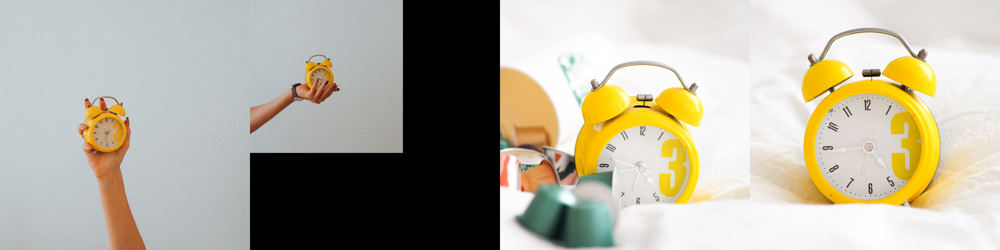

In [5]:
#@title Setup and check the images you have just added
import requests
import glob
from io import BytesIO

def download_image(url):
  try:
    response = requests.get(url)
  except:
    return None
  return Image.open(BytesIO(response.content)).convert("RGB")

images = list(filter(None,[download_image(url) for url in urls]))
save_path = "./my_concept"
if not os.path.exists(save_path):
  os.mkdir(save_path)
[image.save(f"{save_path}/{i}.jpeg") for i, image in enumerate(images)]
image_grid(images, 1, len(images))

<h3>Settings for your newly created concept</h3>
`instance_prompt` is a prompt that should contain a good description of what your object or style is, together with the initializer word `cat_toy` <br>
Change the `prior_preservation` option if you would like class of the concept (e.g.: toy, dog, painting) is guaranteed to be preserved. This increases the quality and helps with generalization at the cost of training time

In [6]:
instance_prompt = "a photo of a blaaahh alarm clock"
prior_preservation = False
prior_preservation_class_prompt = "a photo of a alarm clock"

num_class_images = 12
sample_batch_size = 2
prior_loss_weight = 0.5
prior_preservation_class_folder = "./class_images"
class_data_root=prior_preservation_class_folder
class_prompt=prior_preservation_class_prompt

## Teach the model the new concept (fine-tuning with Dreambooth)
Execute this this sequence of cells to run the training process. The whole process may take from 15 min to 2 hours. (Open this block if you are interested in how this process works under the hood or if you want to change advanced training settings or hyperparameters)

In [7]:
#@title Setup the Classes
from pathlib import Path
from torchvision import transforms

class DreamBoothDataset(Dataset):
    def __init__(
        self,
        instance_data_root,
        instance_prompt,
        tokenizer,
        class_data_root=None,
        class_prompt=None,
        size=512,
        center_crop=False,
    ):
        self.size = size
        self.center_crop = center_crop
        self.tokenizer = tokenizer

        self.instance_data_root = Path(instance_data_root)
        if not self.instance_data_root.exists():
            raise ValueError("Instance images root doesn't exists.")

        self.instance_images_path = list(Path(instance_data_root).iterdir())
        self.num_instance_images = len(self.instance_images_path)
        self.instance_prompt = instance_prompt
        self._length = self.num_instance_images

        if class_data_root is not None:
            self.class_data_root = Path(class_data_root)
            self.class_data_root.mkdir(parents=True, exist_ok=True)
            self.class_images_path = list(Path(class_data_root).iterdir())
            self.num_class_images = len(self.class_images_path)
            self._length = max(self.num_class_images, self.num_instance_images)
            self.class_prompt = class_prompt
        else:
            self.class_data_root = None

        self.image_transforms = transforms.Compose(
            [
                transforms.Resize(size, interpolation=transforms.InterpolationMode.BILINEAR),
                transforms.CenterCrop(size) if center_crop else transforms.RandomCrop(size),
                transforms.ToTensor(),
                transforms.Normalize([0.5], [0.5]),
            ]
        )

    def __len__(self):
        return self._length

    def __getitem__(self, index):
        example = {}
        instance_image = Image.open(self.instance_images_path[index % self.num_instance_images])
        if not instance_image.mode == "RGB":
            instance_image = instance_image.convert("RGB")
        example["instance_images"] = self.image_transforms(instance_image)
        example["instance_prompt_ids"] = self.tokenizer(
            self.instance_prompt,
            padding="do_not_pad",
            truncation=True,
            max_length=self.tokenizer.model_max_length,
        ).input_ids

        if self.class_data_root:
            class_image = Image.open(self.class_images_path[index % self.num_class_images])
            if not class_image.mode == "RGB":
                class_image = class_image.convert("RGB")
            example["class_images"] = self.image_transforms(class_image)
            example["class_prompt_ids"] = self.tokenizer(
                self.class_prompt,
                padding="do_not_pad",
                truncation=True,
                max_length=self.tokenizer.model_max_length,
            ).input_ids

        return example


class PromptDataset(Dataset):
    def __init__(self, prompt, num_samples):
        self.prompt = prompt
        self.num_samples = num_samples

    def __len__(self):
        return self.num_samples

    def __getitem__(self, index):
        example = {}
        example["prompt"] = self.prompt
        example["index"] = index
        return example

In [8]:
#@title Generate Class Images
import gc
if(prior_preservation):
    class_images_dir = Path(class_data_root)
    if not class_images_dir.exists():
        class_images_dir.mkdir(parents=True)
    cur_class_images = len(list(class_images_dir.iterdir()))

    if cur_class_images < num_class_images:
        pipeline = StableDiffusionPipeline.from_pretrained(
            pretrained_model_name_or_path, revision="fp16", torch_dtype=torch.float16
        ).to("cuda")
        pipeline.enable_attention_slicing()
        pipeline.set_progress_bar_config(disable=True)

        num_new_images = num_class_images - cur_class_images
        print(f"Number of class images to sample: {num_new_images}.")

        sample_dataset = PromptDataset(class_prompt, num_new_images)
        sample_dataloader = torch.utils.data.DataLoader(sample_dataset, batch_size=sample_batch_size)

        for example in tqdm(sample_dataloader, desc="Generating class images"):
            images = pipeline(example["prompt"]).images

            for i, image in enumerate(images):
                image.save(class_images_dir / f"{example['index'][i] + cur_class_images}.jpg")
        pipeline = None
        gc.collect()
        del pipeline
        with torch.no_grad():
          torch.cuda.empty_cache()

In [9]:
#@title Load the Stable Diffusion model
# Load models and create wrapper for stable diffusion
text_encoder = CLIPTextModel.from_pretrained(
    pretrained_model_name_or_path, subfolder="text_encoder"
)
vae = AutoencoderKL.from_pretrained(
    pretrained_model_name_or_path, subfolder="vae"
)
unet = UNet2DConditionModel.from_pretrained(
    pretrained_model_name_or_path, subfolder="unet"
)
tokenizer = CLIPTokenizer.from_pretrained(
    pretrained_model_name_or_path,
    subfolder="tokenizer",
)
if vae is not None:
        vae.requires_grad_(False)
text_encoder.requires_grad_(False)
unet.requires_grad_(False)



/usr/local/lib/python3.10/dist-packages/huggingface_hub/utils/_auth.py:94: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(


UNet2DConditionModel(
  (conv_in): Conv2d(4, 320, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (time_proj): Timesteps()
  (time_embedding): TimestepEmbedding(
    (linear_1): Linear(in_features=320, out_features=1280, bias=True)
    (act): SiLU()
    (linear_2): Linear(in_features=1280, out_features=1280, bias=True)
  )
  (down_blocks): ModuleList(
    (0): CrossAttnDownBlock2D(
      (attentions): ModuleList(
        (0-1): 2 x Transformer2DModel(
          (norm): GroupNorm(32, 320, eps=1e-06, affine=True)
          (proj_in): Conv2d(320, 320, kernel_size=(1, 1), stride=(1, 1))
          (transformer_blocks): ModuleList(
            (0): BasicTransformerBlock(
              (norm1): LayerNorm((320,), eps=1e-05, elementwise_affine=True)
              (attn1): Attention(
                (to_q): Linear(in_features=320, out_features=320, bias=False)
                (to_k): Linear(in_features=320, out_features=320, bias=False)
                (to_v): Linear(in_features=320, out_fe

print(text_encoder)

for name, param in unet.named_parameters():
    if param.requires_grad:
        print(name)

print(vae)

print(unet)

def count_trainable_params(model):
    return sum(p.numel() for p in model.parameters() if p.requires_grad)
print(f"Number of trainable parameters in text_encoder: {count_trainable_params(text_encoder)}")
print(f"Number of trainable parameters in vae: {count_trainable_params(vae)}")
print(f"Number of trainable parameters in unet: {count_trainable_params(unet)}")

from peft import LoraConfig, get_peft_model
lora = LoraConfig(
    r=8,
    lora_alpha=32,
    target_modules=['k_proj','v_proj','q_proj','out_proj','fc1','fc2'],
    lora_dropout=0.05,
    bias="none",
)
text_encoder = get_peft_model(text_encoder, lora)


from peft import LoraConfig, get_peft_model
lora = LoraConfig(
    r=8,
    lora_alpha=32,
    target_modules=['conv1','conv2','to_q','to_k','to_v','conv_out','quant_conv','post_quant_conv'],
    lora_dropout=0.05,
    bias="none",
)
vae = get_peft_model(vae, lora)


from peft import LoraConfig, get_peft_model
lora = LoraConfig(
    r=8,
    lora_alpha=32,
    target_modules=['linear_1','linear_2','conv_in','proj_in','to_q','to_k','to_v','to_out.0','proj','ff.net.2','conv1','conv2','conv','time_emb_proj','conv_out'],
    lora_dropout=0.05,
    bias="none",
)
unet = get_peft_model(unet, lora)


print(f"Number of trainable parameters in text_encoder: {count_trainable_params(text_encoder)}")
print(f"Number of trainable parameters in vae: {count_trainable_params(vae)}")
print(f"Number of trainable parameters in unet: {count_trainable_params(unet)}")

In [10]:
#@title Setting up all training args
from argparse import Namespace
args = Namespace(
    pretrained_model_name_or_path=pretrained_model_name_or_path,
    resolution=vae.sample_size,
    center_crop=True,
    train_text_encoder=False, #set to True if you want to train test_encoder
    instance_data_dir=save_path,
    instance_prompt=instance_prompt,
    learning_rate=1e-4,
    max_train_steps=500,
    save_steps=600,
    train_batch_size=2, # set to 1 if using prior preservation
    gradient_accumulation_steps=2,
    max_grad_norm=1.0,
    mixed_precision="fp16", # set to "fp16" for mixed-precision training.
    gradient_checkpointing=True, # set this to True to lower the memory usage.
    use_8bit_adam=True, # use 8bit optimizer from bitsandbytes
    seed=3434554,
    with_prior_preservation=prior_preservation,
    prior_loss_weight=prior_loss_weight,
    sample_batch_size=2,
    class_data_dir=prior_preservation_class_folder,
    class_prompt=prior_preservation_class_prompt,
    num_class_images=num_class_images,
    lr_scheduler="constant",
    lr_warmup_steps=100,
    output_dir="dreambooth-concept",
)

<ipython-input-10-6816ccac2e59>:5: FutureWarning: Accessing config attribute `sample_size` directly via 'AutoencoderKL' object attribute is deprecated. Please access 'sample_size' over 'AutoencoderKL's config object instead, e.g. 'unet.config.sample_size'.
  resolution=vae.sample_size,


In [11]:
#@title Training function
from accelerate.utils import set_seed
from peft import PeftModel,get_peft_model,LoraConfig
from peft.utils import get_peft_model_state_dict, set_peft_model_state_dict
from diffusers.loaders import StableDiffusionLoraLoaderMixin
from diffusers.optimization import get_scheduler
from diffusers.training_utils import _set_state_dict_into_text_encoder, cast_training_params
from diffusers.utils.torch_utils import is_compiled_module
from diffusers.utils import (
    check_min_version,
    convert_state_dict_to_diffusers,
    convert_unet_state_dict_to_peft,
    is_wandb_available,
)
def training_function(text_encoder, vae, unet):
    logger = get_logger(__name__)

    set_seed(args.seed)

    accelerator = Accelerator(
        gradient_accumulation_steps=args.gradient_accumulation_steps,
        mixed_precision=args.mixed_precision,
    )

    # Currently, it's not possible to do gradient accumulation when training two models with accelerate.accumulate
    # This will be enabled soon in accelerate. For now, we don't allow gradient accumulation when training two models.
    # TODO (patil-suraj): Remove this check when gradient accumulation with two models is enabled in accelerate.
    if args.train_text_encoder and args.gradient_accumulation_steps > 1 and accelerator.num_processes > 1:
        raise ValueError(
            "Gradient accumulation is not supported when training the text encoder in distributed training. "
            "Please set gradient_accumulation_steps to 1. This feature will be supported in the future."
        )

    vae.requires_grad_(False)
    if not args.train_text_encoder:
        text_encoder.requires_grad_(False)

    if args.gradient_checkpointing:
        unet.enable_gradient_checkpointing()
        if args.train_text_encoder:
            text_encoder.gradient_checkpointing_enable()
        # now we will add new LoRA weights to the attention layers
    unet_lora_config = LoraConfig(
        r=32,
        lora_alpha=32,
        init_lora_weights="gaussian",
        target_modules=["to_k", "to_q", "to_v", "to_out.0", "add_k_proj", "add_v_proj"],
        use_dora=True,
    )
    unet.add_adapter(unet_lora_config)
    if args.train_text_encoder:
      text_lora_config = LoraConfig(
        r=32,
        lora_alpha=32,
        init_lora_weights="gaussian",
        target_modules=["q_proj", "k_proj", "v_proj", "out_proj"],
    )
      text_encoder.add_adapter(text_lora_config)
    def unwrap_model(model):
      model = accelerator.unwrap_model(model)
      model = model._orig_mod if is_compiled_module(model) else model
      return model
    def save_model_hook(models, weights, output_dir):
        if accelerator.is_main_process:
            # there are only two options here. Either are just the unet attn processor layers
            # or there are the unet and text encoder atten layers
            unet_lora_layers_to_save = None
            text_encoder_lora_layers_to_save = None

            for model in models:
                if isinstance(model, type(unwrap_model(unet))):
                    unet_lora_layers_to_save = convert_state_dict_to_diffusers(get_peft_model_state_dict(model))
                elif isinstance(model, type(unwrap_model(text_encoder))):
                    text_encoder_lora_layers_to_save = convert_state_dict_to_diffusers(
                        get_peft_model_state_dict(model)
                    )
                else:
                    raise ValueError(f"unexpected save model: {model.__class__}")

                # make sure to pop weight so that corresponding model is not saved again
                weights.pop()

            StableDiffusionLoraLoaderMixin.save_lora_weights(
                output_dir,
                unet_lora_layers=unet_lora_layers_to_save,
                text_encoder_lora_layers=text_encoder_lora_layers_to_save,
            )
    def load_model_hook(models, input_dir):
        unet_ = None
        text_encoder_ = None

        while len(models) > 0:
            model = models.pop()

            if isinstance(model, type(unwrap_model(unet))):
                unet_ = model
            elif isinstance(model, type(unwrap_model(text_encoder))):
                text_encoder_ = model
            else:
                raise ValueError(f"unexpected save model: {model.__class__}")

        lora_state_dict, network_alphas = StableDiffusionLoraLoaderMixin.lora_state_dict(input_dir)

        unet_state_dict = {f'{k.replace("unet.", "")}': v for k, v in lora_state_dict.items() if k.startswith("unet.")}
        unet_state_dict = convert_unet_state_dict_to_peft(unet_state_dict)
        incompatible_keys = set_peft_model_state_dict(unet_, unet_state_dict, adapter_name="default")

        if incompatible_keys is not None:
            # check only for unexpected keys
            unexpected_keys = getattr(incompatible_keys, "unexpected_keys", None)
            if unexpected_keys:
                logger.warning(
                    f"Loading adapter weights from state_dict led to unexpected keys not found in the model: "
                    f" {unexpected_keys}. "
                )

        if args.train_text_encoder:
            _set_state_dict_into_text_encoder(lora_state_dict, prefix="text_encoder.", text_encoder=text_encoder_)

        # Make sure the trainable params are in float32. This is again needed since the base models
        # are in `weight_dtype`. More details:
        # https://github.com/huggingface/diffusers/pull/6514#discussion_r1449796804
        if args.mixed_precision == "fp16":
            models = [unet_]
            if args.train_text_encoder:
                models.append(text_encoder_)

            # only upcast trainable parameters (LoRA) into fp32
            cast_training_params(models, dtype=torch.float32)

    accelerator.register_save_state_pre_hook(save_model_hook)
    accelerator.register_load_state_pre_hook(load_model_hook)
    # args.learning_rate = 1e-4

    # Make sure the trainable params are in float32.
    if args.mixed_precision == "fp16":
        models = [unet]
        if args.train_text_encoder:
            models.append(text_encoder)

        # only upcast trainable parameters (LoRA) into fp32
        cast_training_params(models, dtype=torch.float32)

    # Use 8-bit Adam for lower memory usage or to fine-tune the model in 16GB GPUs
    if args.use_8bit_adam:
        optimizer_class = bnb.optim.AdamW8bit
    else:
        optimizer_class = torch.optim.AdamW

    # params_to_optimize = (
    #     itertools.chain(unet.parameters(), text_encoder.parameters()) if args.train_text_encoder else unet.parameters()
    # )
    params_to_optimize = list(filter(lambda p: p.requires_grad, unet.parameters()))
    if args.train_text_encoder:
      params_to_optimize = params_to_optimize + list(filter(lambda p: p.requires_grad, text_encoder.parameters()))

    optimizer = optimizer_class(
        params_to_optimize,
        lr=args.learning_rate,
        betas=(0.9, 0.999),
        weight_decay=1e-2,
        eps=1e-08,
    )

    noise_scheduler = DDPMScheduler.from_config(args.pretrained_model_name_or_path, subfolder="scheduler")

    train_dataset = DreamBoothDataset(
        instance_data_root=args.instance_data_dir,
        instance_prompt=args.instance_prompt,
        class_data_root=args.class_data_dir if args.with_prior_preservation else None,
        class_prompt=args.class_prompt,
        tokenizer=tokenizer,
        size=args.resolution,
        center_crop=args.center_crop,
    )

    def collate_fn(examples):
        input_ids = [example["instance_prompt_ids"] for example in examples]
        pixel_values = [example["instance_images"] for example in examples]

        # concat class and instance examples for prior preservation
        if args.with_prior_preservation:
            input_ids += [example["class_prompt_ids"] for example in examples]
            pixel_values += [example["class_images"] for example in examples]

        pixel_values = torch.stack(pixel_values)
        pixel_values = pixel_values.to(memory_format=torch.contiguous_format).float()

        input_ids = tokenizer.pad(
            {"input_ids": input_ids},
            padding="max_length",
            return_tensors="pt",
            max_length=tokenizer.model_max_length
        ).input_ids

        batch = {
            "input_ids": input_ids,
            "pixel_values": pixel_values,
        }
        return batch

    train_dataloader = torch.utils.data.DataLoader(
        train_dataset, batch_size=args.train_batch_size, shuffle=True, collate_fn=collate_fn
    )

    lr_scheduler = get_scheduler(
        args.lr_scheduler,
        optimizer=optimizer,
        num_warmup_steps=args.lr_warmup_steps * args.gradient_accumulation_steps,
        num_training_steps=args.max_train_steps * args.gradient_accumulation_steps,
    )

    if args.train_text_encoder:
        unet, text_encoder, optimizer, train_dataloader, lr_scheduler = accelerator.prepare(
            unet, text_encoder, optimizer, train_dataloader, lr_scheduler
        )
    else:
        unet, optimizer, train_dataloader, lr_scheduler = accelerator.prepare(
            unet, optimizer, train_dataloader, lr_scheduler
        )

    weight_dtype = torch.float32
    if accelerator.mixed_precision == "fp16":
        weight_dtype = torch.float16
    elif accelerator.mixed_precision == "bf16":
        weight_dtype = torch.bfloat16

    # Move text_encode and vae to gpu.
    # For mixed precision training we cast the text_encoder and vae weights to half-precision
    # as these models are only used for inference, keeping weights in full precision is not required.
    vae.to(accelerator.device, dtype=weight_dtype)
    vae.decoder.to("cpu")
    if not args.train_text_encoder:
        text_encoder.to(accelerator.device, dtype=weight_dtype)

    # We need to recalculate our total training steps as the size of the training dataloader may have changed.
    num_update_steps_per_epoch = math.ceil(len(train_dataloader) / args.gradient_accumulation_steps)
    num_train_epochs = math.ceil(args.max_train_steps / num_update_steps_per_epoch)

    # Train!
    total_batch_size = args.train_batch_size * accelerator.num_processes * args.gradient_accumulation_steps

    logger.info("***** Running training *****")
    logger.info(f"  Num examples = {len(train_dataset)}")
    logger.info(f"  Instantaneous batch size per device = {args.train_batch_size}")
    logger.info(f"  Total train batch size (w. parallel, distributed & accumulation) = {total_batch_size}")
    logger.info(f"  Gradient Accumulation steps = {args.gradient_accumulation_steps}")
    logger.info(f"  Total optimization steps = {args.max_train_steps}")
    # Only show the progress bar once on each machine.
    progress_bar = tqdm(range(args.max_train_steps), disable=not accelerator.is_local_main_process)
    progress_bar.set_description("Steps")
    global_step = 0

    for epoch in range(num_train_epochs):
        unet.train()
        for step, batch in enumerate(train_dataloader):
            with accelerator.accumulate(unet):
                # Convert images to latent space
                latents = vae.encode(batch["pixel_values"].to(dtype=weight_dtype)).latent_dist.sample()
                latents = latents * 0.18215

                # Sample noise that we'll add to the latents
                noise = torch.randn_like(latents)
                bsz = latents.shape[0]
                # Sample a random timestep for each image
                timesteps = torch.randint(0, noise_scheduler.config.num_train_timesteps, (bsz,), device=latents.device)
                timesteps = timesteps.long()

                # Add noise to the latents according to the noise magnitude at each timestep
                # (this is the forward diffusion process)
                noisy_latents = noise_scheduler.add_noise(latents, noise, timesteps)

                # Get the text embedding for conditioning
                encoder_hidden_states = text_encoder(batch["input_ids"])[0]

                # Predict the noise residual
                noise_pred = unet(noisy_latents, timesteps, encoder_hidden_states).sample

                # Get the target for loss depending on the prediction type
                if noise_scheduler.config.prediction_type == "epsilon":
                    target = noise
                elif noise_scheduler.config.prediction_type == "v_prediction":
                    target = noise_scheduler.get_velocity(latents, noise, timesteps)
                else:
                    raise ValueError(f"Unknown prediction type {noise_scheduler.config.prediction_type}")

                if args.with_prior_preservation:
                    # Chunk the noise and noise_pred into two parts and compute the loss on each part separately.
                    noise_pred, noise_pred_prior = torch.chunk(noise_pred, 2, dim=0)
                    target, target_prior = torch.chunk(target, 2, dim=0)

                    # Compute instance loss
                    loss = F.mse_loss(noise_pred.float(), target.float(), reduction="none").mean([1, 2, 3]).mean()

                    # Compute prior loss
                    prior_loss = F.mse_loss(noise_pred_prior.float(), target_prior.float(), reduction="mean")

                    # Add the prior loss to the instance loss.
                    loss = loss + args.prior_loss_weight * prior_loss
                else:
                    loss = F.mse_loss(noise_pred.float(), target.float(), reduction="mean")

                accelerator.backward(loss)

                if accelerator.sync_gradients:
                    params_to_clip = (
                        itertools.chain(unet.parameters(), text_encoder.parameters())
                        if args.train_text_encoder
                        else unet.parameters()
                    )
                    accelerator.clip_grad_norm_(unet.parameters(), args.max_grad_norm)
                optimizer.step()
                optimizer.zero_grad()

            # Checks if the accelerator has performed an optimization step behind the scenes
            if accelerator.sync_gradients:
                progress_bar.update(1)
                global_step += 1

                if global_step % args.save_steps == 0:
                    unet_model = unet.base_model.model
                    text_encoder_model = text_encoder.base_model.model
                    if accelerator.is_main_process:
                        pipeline = StableDiffusionPipeline.from_pretrained(
                            args.pretrained_model_name_or_path,
                            unet=accelerator.unwrap_model(unet_model),
                            text_encoder=accelerator.unwrap_model(text_encoder_model),
                        )
                        save_path = os.path.join(args.output_dir, f"checkpoint-{global_step}")
                        accelerator.save_state(save_path)
                        # pipeline.save_pretrained(save_path)

            logs = {"loss": loss.detach().item()}
            progress_bar.set_postfix(**logs)

            if global_step >= args.max_train_steps:
                break

        accelerator.wait_for_everyone()

    # Create the pipeline using using the trained modules and save it.
    if accelerator.is_main_process:
        # unet_model = unet.base_model.model
        # text_encoder_model = text_encoder.base_model.model
        unet = unwrap_model(unet)
        unet = unet.to(torch.float32)

        unet_lora_state_dict = convert_state_dict_to_diffusers(get_peft_model_state_dict(unet))

        if args.train_text_encoder:
            text_encoder = unwrap_model(text_encoder)
            text_encoder_state_dict = convert_state_dict_to_diffusers(get_peft_model_state_dict(text_encoder))
        else:
            text_encoder_state_dict = None

        StableDiffusionLoraLoaderMixin.save_lora_weights(
            save_directory=args.output_dir,
            unet_lora_layers=unet_lora_state_dict,
            text_encoder_lora_layers=text_encoder_state_dict,
        )
    accelerator.end_training()
        # pipeline = StableDiffusionPipeline.from_pretrained(
        #     args.pretrained_model_name_or_path,
        #     unet=accelerator.unwrap_model(unet_model),
        #     text_encoder=accelerator.unwrap_model(text_encoder_model),
        # )
        # pipeline.save_pretrained(args.output_dir)

In [12]:
#@title Run training
import accelerate
accelerate.notebook_launcher(training_function, args=(text_encoder, vae, unet))
for param in itertools.chain(unet.parameters(), text_encoder.parameters()):
  if param.grad is not None:
    del param.grad  # free some memory
  torch.cuda.empty_cache()

Launching training on one GPU.


/usr/local/lib/python3.10/dist-packages/accelerate/accelerator.py:494: FutureWarning: `torch.cuda.amp.GradScaler(args...)` is deprecated. Please use `torch.amp.GradScaler('cuda', args...)` instead.
  self.scaler = torch.cuda.amp.GradScaler(**kwargs)
/usr/local/lib/python3.10/dist-packages/diffusers/configuration_utils.py:245: FutureWarning: It is deprecated to pass a pretrained model name or path to `from_config`.If you were trying to load a scheduler, please use <class 'diffusers.schedulers.scheduling_ddpm.DDPMScheduler'>.from_pretrained(...) instead. Otherwise, please make sure to pass a configuration dictionary instead. This functionality will be removed in v1.0.0.
  deprecate("config-passed-as-path", "1.0.0", deprecation_message, standard_warn=False)


  0%|          | 0/500 [00:00<?, ?it/s]

<h2> Run the code with your newly trained model</h2>
If you have just trained your model with the code above, use the block below to run it.

In [13]:
!pip install git+https://github.com/openai/CLIP.git


  Cloning https://github.com/openai/CLIP.git to /tmp/pip-req-build-smwdza2m
  Running command git clone --filter=blob:none --quiet https://github.com/openai/CLIP.git /tmp/pip-req-build-smwdza2m
  Resolved https://github.com/openai/CLIP.git to commit dcba3cb2e2827b402d2701e7e1c7d9fed8a20ef1
  Preparing metadata (setup.py) ... done


In [14]:
import torch
import clip
from PIL import Image
from torch.utils.data import DataLoader
import numpy as np

# Load the CLIP model and processor
device = "cuda" if torch.cuda.is_available() else "cpu"
model, preprocess = clip.load("ViT-B/32", device=device)

def calculate_clip_score(model, preprocess, image_text_pairs):
    """
    Calculate the average CLIP score for a list of (image, text) pairs.

    Parameters:
    - model: The CLIP model.
    - preprocess: The preprocessing function for the model.
    - image_text_pairs: List of tuples, each containing an image path and corresponding prompt text.

    Returns:
    - avg_score: Average CLIP score for the provided pairs.
    """

    # Preprocess images and encode texts
    image_embeddings = []
    text_embeddings = []

    for image_path, text_prompt in image_text_pairs:
        image = preprocess(Image.open(image_path)).unsqueeze(0).to(device)
        text = clip.tokenize([text_prompt]).to(device)

        with torch.no_grad():
            image_features = model.encode_image(image)
            text_features = model.encode_text(text)

        # Normalize features to unit length
        image_features /= image_features.norm(dim=-1, keepdim=True)
        text_features /= text_features.norm(dim=-1, keepdim=True)

        # Calculate cosine similarity between image and text
        similarity = (image_features @ text_features.T).squeeze().item()
        image_embeddings.append(similarity)

    # Calculate average score over all pairs
    avg_score = np.mean(image_embeddings)
    return avg_score

# Example usage
# image_text_pairs = [
#     ("generated_image_1.png", "A photo of a dog in the park"),
#     ("generated_image_2.png", "A close-up of a flower with morning dew"),
#     # Add more (image path, prompt) pairs as needed
# ]

# avg_clip_score = calculate_clip_score(model, preprocess, image_text_pairs)
# print(f"Average CLIP Score: {avg_clip_score}")


In [15]:
#@title Set up the pipeline
from diffusers import DPMSolverMultistepScheduler
pipe = StableDiffusionPipeline.from_pretrained(
        args.pretrained_model_name_or_path, revision=None, variant=None, torch_dtype=torch.float16
    )
pipe.load_lora_weights(args.output_dir, weight_name="pytorch_lora_weights.safetensors")
pipe.scheduler = DPMSolverMultistepScheduler.from_config(pipe.scheduler.config)
pipe.to("cuda")

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(


StableDiffusionPipeline {
  "_class_name": "StableDiffusionPipeline",
  "_diffusers_version": "0.31.0",
  "_name_or_path": "CompVis/stable-diffusion-v1-4",
  "feature_extractor": [
    "transformers",
    "CLIPImageProcessor"
  ],
  "image_encoder": [
    null,
    null
  ],
  "requires_safety_checker": true,
  "safety_checker": [
    "stable_diffusion",
    "StableDiffusionSafetyChecker"
  ],
  "scheduler": [
    "diffusers",
    "DPMSolverMultistepScheduler"
  ],
  "text_encoder": [
    "transformers",
    "CLIPTextModel"
  ],
  "tokenizer": [
    "transformers",
    "CLIPTokenizer"
  ],
  "unet": [
    "diffusers",
    "UNet2DConditionModel"
  ],
  "vae": [
    "diffusers",
    "AutoencoderKL"
  ]
}

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

Average CLIP Score: 0.283905029296875


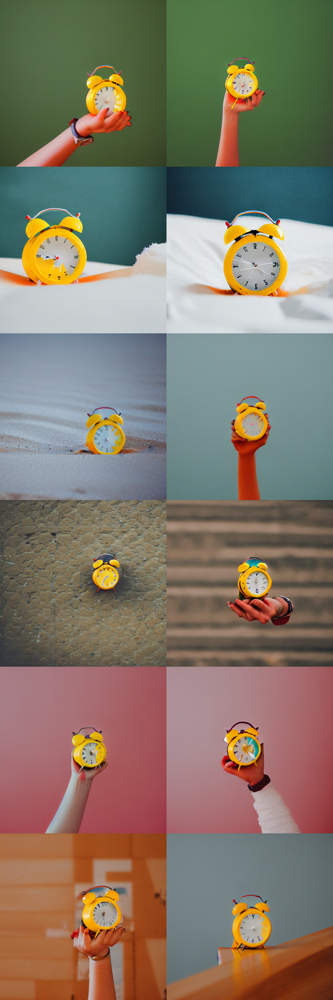

In [16]:
#@title Run the Stable Diffusion pipeline on Colab

import os
import shutil
prompt_list = [
'a photo of a blaaahh alarm clock in the jungle',
'a photo of a blaaahh alarm clock in the snow',
'a photo of a blaaahh alarm clock on the beach',
'a photo of a blaaahh alarm clock on a cobblestone street',
'a photo of a blaaahh alarm clock on top of pink fabric',
'a photo of a blaaahh alarm clock on top of a wooden floor',
]
image_text_pairs=[]
# prompt = "a mini yellow alarm clock in a jungle"
num_samples = 2
num_rows = len(prompt_list)
output_dir = "stable_diffusion_outputs"  # Specify the output directory
if not os.path.exists(output_dir):
  os.makedirs(output_dir)
if os.path.exists(output_dir) and os.path.isdir(output_dir):
  # Remove the directory and its contents recursively
  shutil.rmtree(output_dir)
  # Recreate an empty directory with the same name
  os.makedirs(output_dir, exist_ok=True)  # Create the directory if it doesn't exist
  # os.makedirs(output_dir)

all_images = []
for _ in range(num_rows):
    images = pipe(prompt_list[_], num_images_per_prompt=num_samples, num_inference_steps=25, guidance_scale=9).images
    all_images.extend(images)

    # Save each image individually
    for i, image in enumerate(images):
        image_path = os.path.join(output_dir, f"{prompt_list[_]}_{i}.png")  # Create a unique filename
        image_text_pairs.append((image_path, prompt_list[_]))
        image.save(image_path)

grid = image_grid(all_images, num_rows, num_samples)

avg_clip_score = calculate_clip_score(model, preprocess, image_text_pairs)
print(f"Average CLIP Score: {avg_clip_score}")
grid

In [17]:
from google.colab import files
import shutil

# Replace 'your_folder_name' with the path to your folder
shutil.make_archive('/content/stable_diffusion_outputs', 'zip', '/content/stable_diffusion_outputs')

# Download the zip file
files.download('stable_diffusion_outputs.zip')


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>